In [12]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [13]:
# Install necessary libraries
!pip install pims
!pip install trackpy
!pip install stardist
!pip install imagecodecs

In [14]:
# Import libraries
import numpy as np
import pims
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
from stardist.models import StarDist2D
from stardist.plot import render_label
from csbdeep.utils import normalize
from tifffile import imsave

In [15]:
# Define the stardist segmentation function
def stardist_segm(img, model):
    img_labels, img_details = model.predict_instances(normalize(img))
    return img_labels

In [18]:
# Define the function to process and save images
def process_and_save_images(input_folder, output_folder, plot_folder, model):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    if not os.path.exists(plot_folder):
        os.makedirs(plot_folder)

    for filename in os.listdir(input_folder):
        if filename.endswith(".tif") or filename.endswith(".tiff"):
            image_path = os.path.join(input_folder, filename)
            my_fl_img = pims.open(image_path)

            # Check if the image is a stack or single image
            if len(my_fl_img) > 1:
                my_fl_img = my_fl_img[0]
            else:
                my_fl_img = my_fl_img[0]

            label_image = stardist_segm(my_fl_img, model)

            # Save the segmented image with modified name
            output_filename = "segmented_" + filename
            output_path = os.path.join(output_folder, output_filename)
            plt.imsave(output_path, label_image, cmap='gray', format='tiff')

            # Plot image with modified name
            plot_filename = "combined_" + filename

            # Plot the original and segmented images
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(my_fl_img, cmap="gray")
            plt.axis("off")
            plt.title(filename)

            plt.subplot(1, 2, 2)
            plt.imshow(render_label(label_image, img=my_fl_img))
            plt.axis("off")
            plt.title("Prediction + Input Overlay")

            # Save the plot in the plot folder
            plot_output_path = os.path.join(plot_folder, plot_filename.replace(".tif", ".png"))
            plt.savefig(plot_output_path)

            plt.show()

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


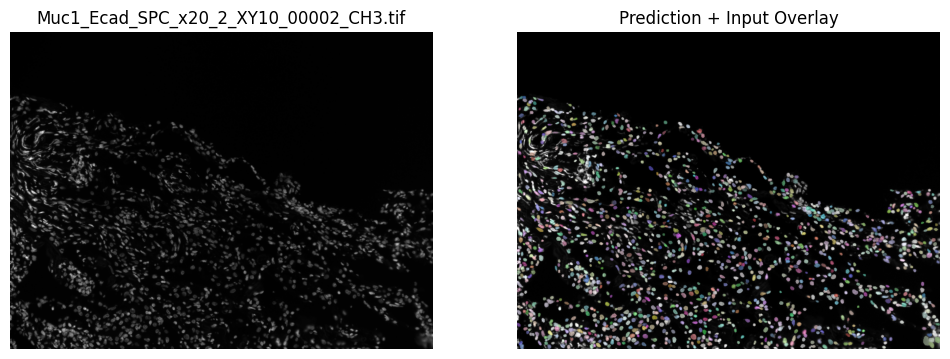

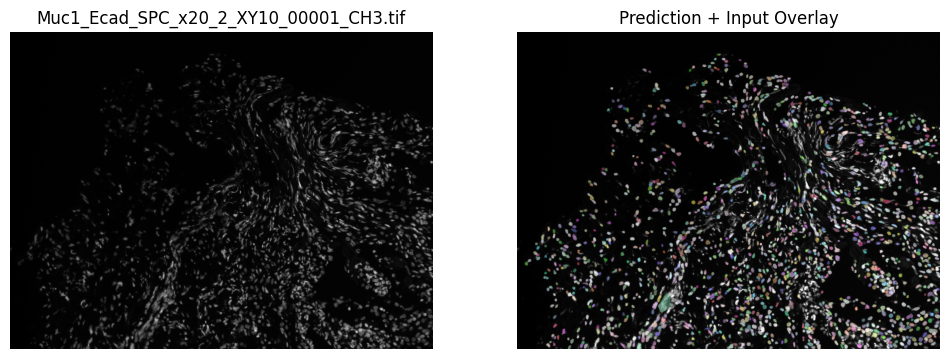

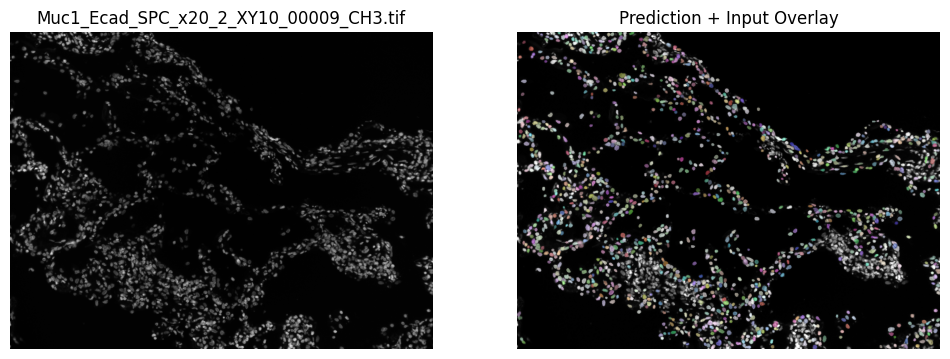

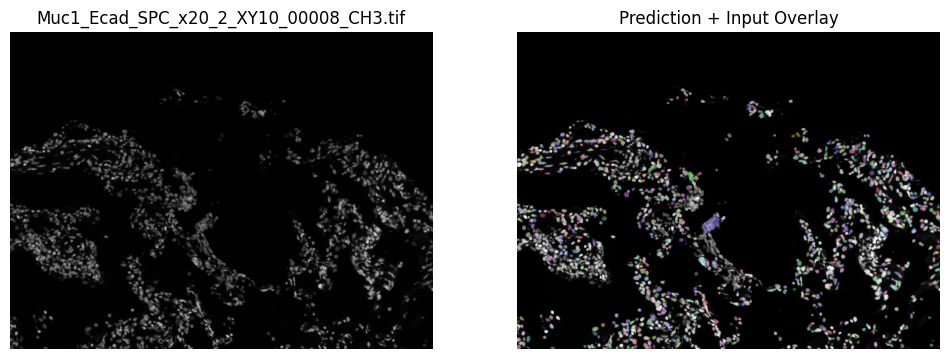

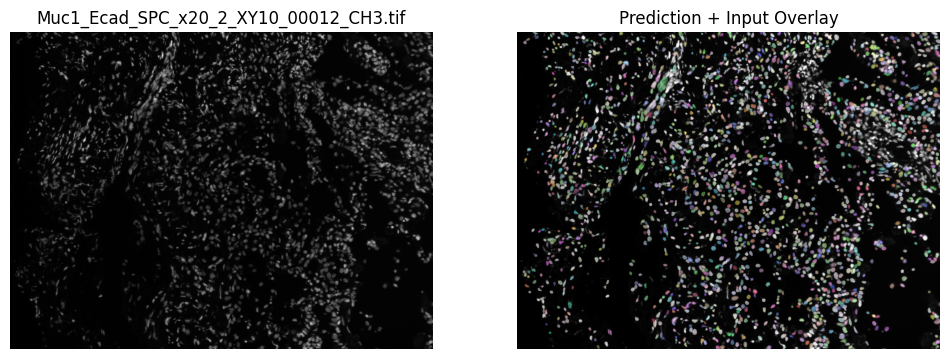

...

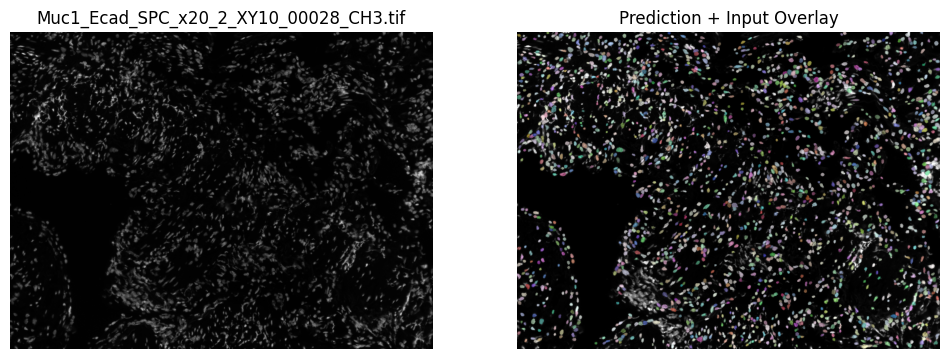

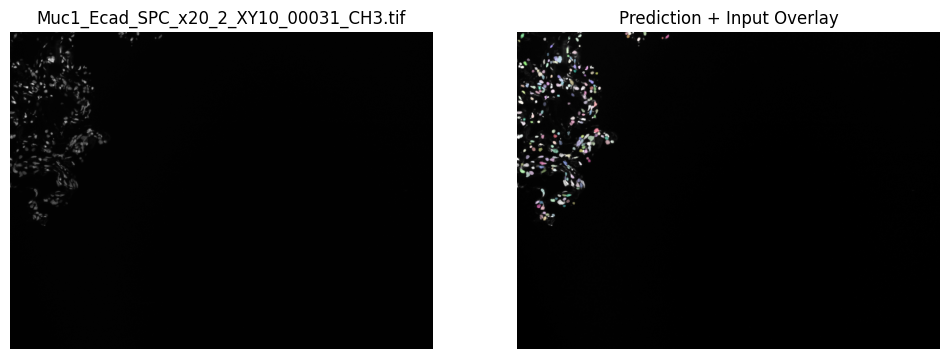

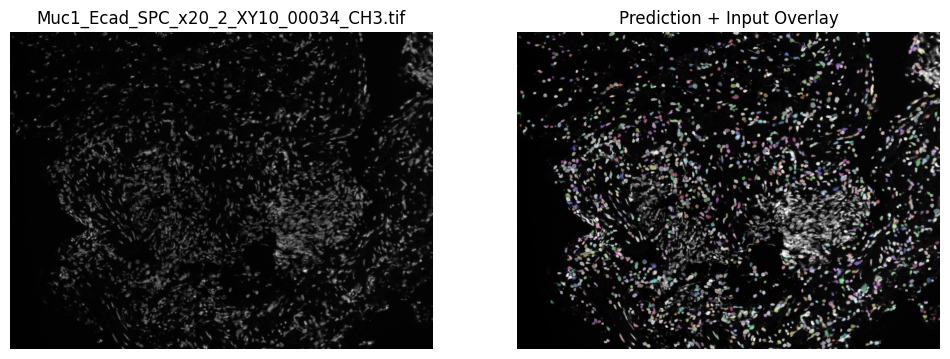

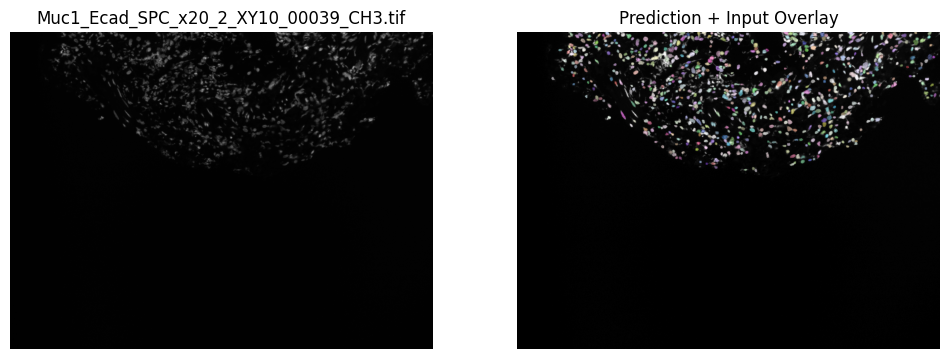

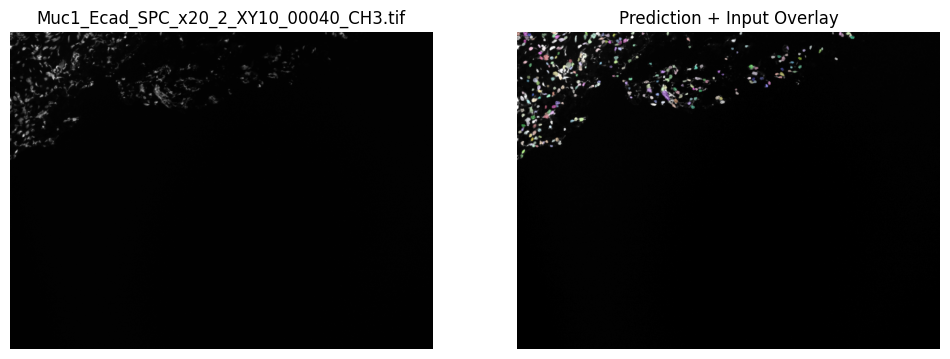

In [19]:
# Load pretrained model
model = StarDist2D.from_pretrained('2D_versatile_fluo')

# Set input and output directories
input_folder = '/content/drive/MyDrive/Nuclei Segmentation/original/'
output_folder = '/content/drive/MyDrive/Nuclei Segmentation/segmented/'
plot_folder = '/content/drive/MyDrive/Nuclei Segmentation/plots/'

# Process and save images
process_and_save_images(input_folder, output_folder, plot_folder, model)